# BLIP

## Data PreProcessing

In [ ]:
import pandas as pd
import os
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import train_test_split
import torch
from torchvision import transforms
from PIL import Image

data_dir = "/content/drive/MyDrive/Data_Project"  

#photos.tsv that contains photo_description and photo_image_url
photos_df = pd.read_csv(os.path.join(data_dir, "photos.tsv000"), sep="\t")

#keywords.tsv that contain keywords to each images
keywords_df = pd.read_csv(os.path.join(data_dir, "keywords.tsv000"), sep="\t")

#merge data photos and keywords on basis of photo_id
merged_df = pd.merge(photos_df, keywords_df, on="photo_id", how="inner")
print(f"Data Loaded: {len(merged_df)} rows")

def preprocess_data(df, sample_size=1000):
    """
    Preprocess the data by reducing its size.
    """
    return df.sample(sample_size, random_state=42)

preprocessed_df = preprocess_data(merged_df)

Data Loaded: 2706955 rows


In [ ]:
print(preprocessed_df.columns)

Index(['photo_id', 'photo_url', 'photo_image_url', 'photo_submitted_at',
       'photo_featured', 'photo_width', 'photo_height', 'photo_aspect_ratio',
       'photo_description', 'photographer_username', 'photographer_first_name',
       'photographer_last_name', 'exif_camera_make', 'exif_camera_model',
       'exif_iso', 'exif_aperture_value', 'exif_focal_length',
       'exif_exposure_time', 'photo_location_name', 'photo_location_latitude',
       'photo_location_longitude', 'photo_location_country',
       'photo_location_city', 'stats_views', 'stats_downloads',
       'ai_description', 'ai_primary_landmark_name',
       'ai_primary_landmark_latitude', 'ai_primary_landmark_longitude',
       'ai_primary_landmark_confidence', 'blur_hash', 'keyword',
       'ai_service_1_confidence', 'ai_service_2_confidence',
       'suggested_by_user'],
      dtype='object')


In [ ]:
print(preprocessed_df.head())  
print(preprocessed_df.columns)  

            photo_id                                photo_url  \
2612823  wn57cSQ7VzI  https://unsplash.com/photos/wn57cSQ7VzI   
2544208  USuDsWIPgNA  https://unsplash.com/photos/USuDsWIPgNA   
1246873  7eu20lUGuGc  https://unsplash.com/photos/7eu20lUGuGc   
1857824  ZUeaIyohD2Q  https://unsplash.com/photos/ZUeaIyohD2Q   
1306513  PhpTxWLuQ1I  https://unsplash.com/photos/PhpTxWLuQ1I   

                                           photo_image_url  \
2612823  https://images.unsplash.com/photo-143943476819...   
2544208  https://images.unsplash.com/photo-157764743848...   
1246873  https://images.unsplash.com/photo-1559113572-4...   
1857824  https://images.unsplash.com/photo-1542810999-4...   
1306513  https://images.unsplash.com/photo-1544875771-3...   

                 photo_submitted_at photo_featured  photo_width  photo_height  \
2612823  2015-08-13 03:00:49.443685              t         3888          2592   
2544208  2019-12-29 19:24:10.212707              t         4000          3

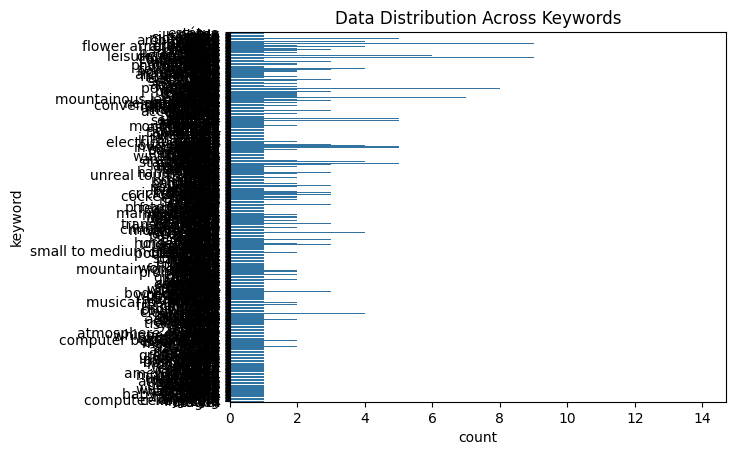

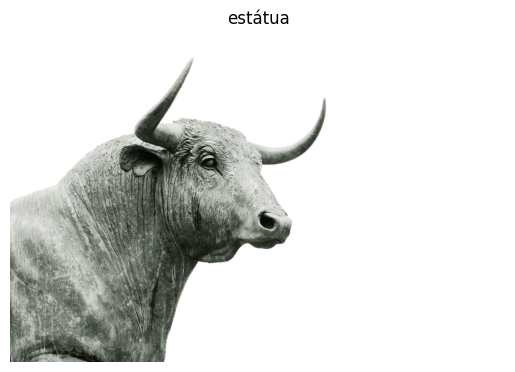

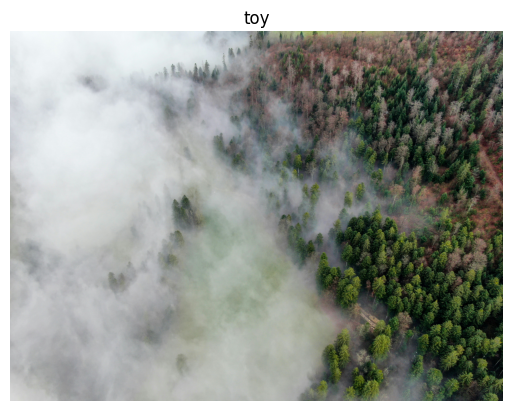

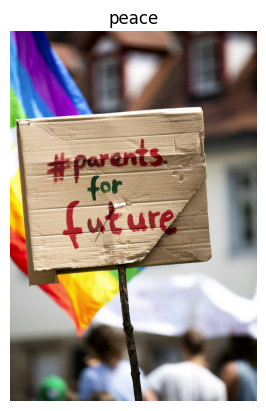

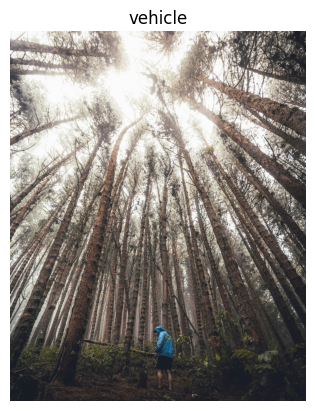

...

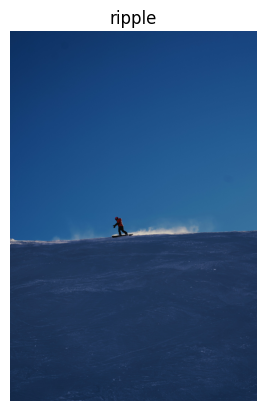

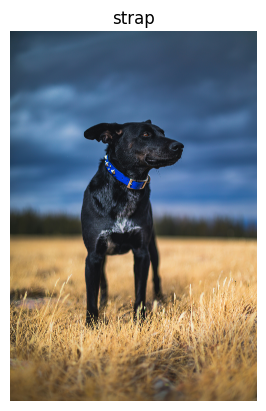

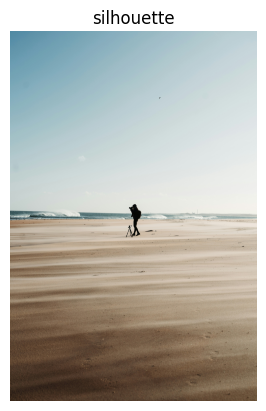

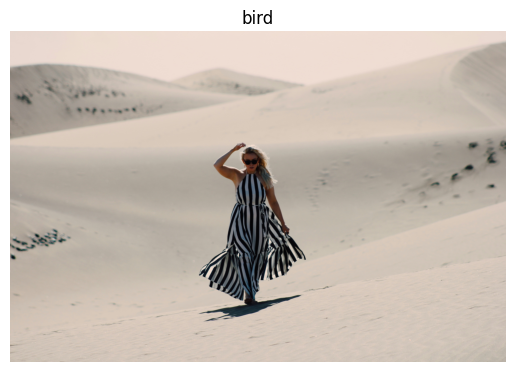

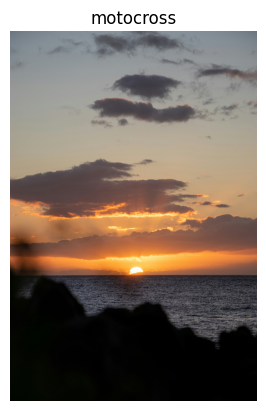

In [ ]:
import requests
import seaborn as sns
import matplotlib.pyplot as plt
from PIL import Image

#visualize Data Preprocessed
sns.countplot(y=preprocessed_df['keyword'])
plt.title("Data Distribution Across Keywords")
plt.show()

#show images with keywords
unique_keywords = preprocessed_df['keyword'].unique()[:10]  
for keyword in unique_keywords:
    sample = preprocessed_df[preprocessed_df['keyword'] == keyword].iloc[0]
    try:
        img = Image.open(requests.get(sample['photo_image_url'], stream=True).raw)
        plt.imshow(img)
        plt.title(keyword)
        plt.axis('off')
        plt.show()
    except Exception as e:
        print(f"Error displaying image for keyword '{keyword}': {e}")

In [ ]:
import os
import json
from transformers import TrainingArguments, Trainer, BlipProcessor, BlipForConditionalGeneration, EarlyStoppingCallback
from datasets import Dataset, load_dataset
from sklearn.model_selection import train_test_split
from PIL import Image
import requests
import pandas as pd
from sklearn.preprocessing import LabelEncoder
import matplotlib.pyplot as plt
import seaborn as sns
import torch
from torchvision import transforms

#label encoder
label_encoder = LabelEncoder()

#Load and Merge Data
data_dir = "/content/gdrive/MyDrive/Data_Project"  
photos_df = pd.read_csv(os.path.join(data_dir, "photos.tsv000"), sep="\t")
keywords_df = pd.read_csv(os.path.join(data_dir, "keywords.tsv000"), sep="\t")

merged_df = pd.merge(photos_df, keywords_df, on="photo_id", how="inner")
print(f"Data Loaded: {len(merged_df)} rows")

def preprocess_data(df, sample_size=1000):
    """
    Preprocess the data by reducing its size.
    """
    return df.sample(sample_size, random_state=42)

preprocessed_df = preprocess_data(merged_df)

#preprocessed_df contains 'photo_description' and 'keyword' columns
preprocessed_df = preprocessed_df.dropna(subset=['photo_description', 'keyword']).reset_index(drop=True)

#Mapping 'photo_description' as input and 'keyword' as the label
train_df, test_df = train_test_split(preprocessed_df[['photo_description', 'keyword', 'photo_image_url']], test_size=0.2, random_state=42)

#renaming columns for Hugging Face Trainer compatibility
train_df.rename(columns={'photo_description': 'input_text', 'keyword': 'label', 'photo_image_url': 'image_path'}, inplace=True)
test_df.rename(columns={'photo_description': 'input_text', 'keyword': 'label', 'photo_image_url': 'image_path'}, inplace=True)

#Fftting and transforming the labels (keywords) to numeric values
train_df['label'] = label_encoder.fit_transform(train_df['label'])

def handle_unknown_labels(label):
    """
    Create a mapping for unseen labels in the test and train Dataset.
    """
    try:
        return label_encoder.transform([label])[0]  
    except ValueError:  
        return len(label_encoder.classes_)  

#transforming the test data by handling unknown labels
test_df['label'] = test_df['label'].apply(handle_unknown_labels)

#prepare test and train dataset
train_dataset = Dataset.from_pandas(train_df)
test_dataset = Dataset.from_pandas(test_df)

def preprocess_image_text(examples, processor):
    """
    Preprocesses image-text pairs by loading images, resizing if necessary, and tokenizing the text captions for model input.
    """
    images = []
    texts = []
    MAX_PIXEL_COUNT = 1024 * 1024  

    for i in range(len(examples['image_path'])):
        image_url = examples["image_path"][i]
        text = examples["input_text"][i]

        try:
            image = Image.open(requests.get(image_url, stream=True).raw).convert("RGB")
        except Exception as e:
            print(f"Error loading image from {image_url}: {e}")
            image = Image.new('RGB', (256, 256))  

        width, height = image.size
        pixel_count = width * height
        if pixel_count > MAX_PIXEL_COUNT:
            image.thumbnail((512, 512))

        images.append(image)
        texts.append(text)

    inputs = processor(text=texts, images=images, return_tensors="pt", padding="max_length", truncation=True)

    input_ids = inputs['input_ids']  
    labels = input_ids.clone()  

    labels[:, 1:] = input_ids[:, :-1] 
    labels[:, 0] = -100  

    inputs['labels'] = labels

    inputs = {key: torch.tensor(value) for key, value in inputs.items()}

    return inputs

#Preprocessing test and train dataset
train_dataset = train_dataset.map(preprocess_image_text, batched=True)
test_dataset = test_dataset.map(preprocess_image_text, batched=True)

#Example of train dataset
print("First example from train dataset:")
print(train_dataset[0])

input_ids_tensor = torch.tensor(train_dataset[0]["input_ids"])
labels_tensor = torch.tensor(train_dataset[0]["labels"])

print("Shape of input_ids:", input_ids_tensor.shape)
print("Shape of labels:", labels_tensor.shape)

Data Loaded: 2706955 rows


/usr/local/lib/python3.10/dist-packages/huggingface_hub/utils/_auth.py:94: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(


preprocessor_config.json:   0%|          | 0.00/287 [00:00<?, ?B/s]

tokenizer_config.json:   0%|          | 0.00/506 [00:00<?, ?B/s]

vocab.txt:   0%|          | 0.00/232k [00:00<?, ?B/s]

tokenizer.json:   0%|          | 0.00/711k [00:00<?, ?B/s]

special_tokens_map.json:   0%|          | 0.00/125 [00:00<?, ?B/s]

config.json:   0%|          | 0.00/4.56k [00:00<?, ?B/s]

pytorch_model.bin:   0%|          | 0.00/990M [00:00<?, ?B/s]

Map:   0%|          | 0/309 [00:00<?, ? examples/s]

/usr/local/lib/python3.10/dist-packages/PIL/Image.py:3406: DecompressionBombWarning: Image size (98058240 pixels) exceeds limit of 89478485 pixels, could be decompression bomb DOS attack.
  warnings.warn(
<ipython-input-4-873995ec890b>:129: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  inputs = {key: torch.tensor(value) for key, value in inputs.items()}


Map:   0%|          | 0/78 [00:00<?, ? examples/s]

First example from train dataset:
{'input_text': 'Flowers', 'label': 132, 'image_path': 'https://images.unsplash.com/photo-1585267149231-b8cfd1cd7453', '__index_level_0__': 237, 'pixel_values': [[[0.7478637099266052, 0.7624621391296387, 0.806257426738739, 0.864651083946228, 0.9084463715553284, 0.9230448007583618, 0.9668400883674622, 0.996036946773529, 0.996036946773529, 1.0252337455749512, 1.0398322343826294, 1.0398322343826294, 1.0690290927886963, 1.1128243207931519, 1.1420211791992188, 1.1858164072036743, 1.2296117544174194, 1.2150132656097412, 1.2296117544174194, 1.2150132656097412, 1.244210124015808, 1.2880054712295532, 1.3172023296356201, 1.3172023296356201, 1.3172023296356201, 1.3172023296356201, 1.302603840827942, 1.302603840827942, 1.302603840827942, 1.2880054712295532, 1.2880054712295532, 1.2588086128234863, 1.2588086128234863, 1.2150132656097412, 1.2150132656097412, 1.244210124015808, 1.2296117544174194, 1.273406982421875, 1.273406982421875, 1.302603840827942, 1.3318006992340

## Model Training

### Model 1

### Model 1 (Epochs = 10, Learning Rate = 1e-5, Early Stopping)

In [ ]:
import os
import torch
from torch import nn
from torch.utils.data import Dataset, DataLoader
from transformers import Trainer, TrainingArguments, EarlyStoppingCallback
import numpy as np
from transformers import AdamW
from torch.optim import Adam
from transformers import get_scheduler
from transformers import Trainer, TrainingArguments, EarlyStoppingCallback

class CNNImageEncoder(nn.Module):
    def __init__(self, input_channels=3, output_dim=512):
        """
        CNN-based image encoder with convolutional layers followed by a fully connected layer.
        """
        super(CNNImageEncoder, self).__init__()
        self.conv1 = nn.Conv2d(input_channels, 64, kernel_size=3, stride=1, padding=1)
        self.conv2 = nn.Conv2d(64, 128, kernel_size=3, stride=1, padding=1)
        self.conv3 = nn.Conv2d(128, 256, kernel_size=3, stride=1, padding=1)
        self.conv4 = nn.Conv2d(256, 512, kernel_size=3, stride=1, padding=1)
        self.pool = nn.MaxPool2d(2, 2)  
        self.fc = nn.Linear(512 * 8 * 8, output_dim)  

    def forward(self, x):
        """
        Forward pass through the CNN encoder.
        """
        x = self.pool(torch.relu(self.conv1(x)))  
        x = self.pool(torch.relu(self.conv2(x)))  
        x = self.pool(torch.relu(self.conv3(x)))  
        x = self.pool(torch.relu(self.conv4(x)))  
        x = x.view(x.size(0), -1)  
        x = self.fc(x)  
        return x

class TransformerDecoder(nn.Module):
    def __init__(self, vocab_size, hidden_dim, n_layers=6, n_heads=8, max_position_embeddings=512):
        """
        Transformer decoder with embedding, transformer blocks, and output layer.
        """
        super(TransformerDecoder, self).__init__()
        self.embedding = nn.Embedding(vocab_size, hidden_dim)  
        self.position_embedding = nn.Embedding(max_position_embeddings, hidden_dim)  
        self.transformer_blocks = nn.ModuleList(
            [nn.TransformerDecoderLayer(d_model=hidden_dim, nhead=n_heads) for _ in range(n_layers)]  
        )
        self.fc_out = nn.Linear(hidden_dim, vocab_size) 

    def forward(self, input_ids, attention_mask, encoder_hidden_states):
        """
        Forward pass through the transformer decoder, returns the logits predicting the next token in the sequence.
        """
        seq_len = input_ids.size(1)  
        position_ids = torch.arange(seq_len, device=input_ids.device).unsqueeze(0).expand(input_ids.size(0), -1)  

        embeddings = self.embedding(input_ids) + self.position_embedding(position_ids)

        mask = attention_mask.unsqueeze(1).unsqueeze(2)  
        
        output = embeddings
        for layer in self.transformer_blocks:
            output = layer(output, encoder_hidden_states, memory_key_padding_mask=mask)

        logits = self.fc_out(output)
        return logits

class BLIPModel(nn.Module):
    def __init__(self, image_encoder, text_decoder, hidden_dim):
        """
        BLIP model that combines a CNN image encoder with a Transformer-based text decoder.
        """
        super(BLIPModel, self).__init__()
        self.image_encoder = image_encoder  
        self.text_decoder = text_decoder  
        self.hidden_dim = hidden_dim

        # Project image features to the same dimension as the text embeddings
        self.image_to_text_projection = nn.Linear(image_encoder.fc.in_features, hidden_dim)

        # Cross-attention layer to integrate image and text
        self.cross_attention = nn.MultiheadAttention(hidden_dim, num_heads=8, batch_first=True)

    def forward(self, image_features, input_ids, attention_mask, labels=None):
        """
        Forward pass through the combined image encoder and text decoder.
        Computes loss and logits.
        """
        encoded_images = self.image_encoder(image_features).unsqueeze(1)  # Shape: [batch_size, 1, hidden_dim]

        projected_images = self.image_to_text_projection(encoded_images)  # Shape: [batch_size, 1, hidden_dim]

        text_embeds = self.text_decoder.embedding(input_ids)  # Shape: [batch_size, seq_len, hidden_dim]

        attended_features, _ = self.cross_attention(text_embeds, projected_images, projected_images)

        logits = self.text_decoder(attended_features, attention_mask, projected_images)

        if labels is not None:
            # Compute the loss if labels are provided
            loss_fct = nn.CrossEntropyLoss(ignore_index=-100)  
            loss = loss_fct(logits.view(-1, logits.size(-1)), labels.view(-1))  
            return loss, logits  
        return logits  # Return logits if no labels are provided (for generation)


    def generate(self, image_features, max_length=20, num_beams=5, early_stopping=True):
        """
        Generate a caption for the input image features using the BLIP model.
        Args:
            image_features: The features extracted from the image.
            max_length: Maximum length of the generated caption.
            num_beams: Number of beams for beam search (for better generation).
            early_stopping: Whether to stop generation when the end token is generated.
        """
        encoded_images = self.image_encoder(image_features).unsqueeze(1)  
        projected_images = self.image_to_text_projection(encoded_images)  

        input_ids = torch.zeros((image_features.size(0), 1), dtype=torch.long).to(image_features.device)  
        
        for _ in range(max_length):
            text_embeds = self.text_decoder.embedding(input_ids)  
            
            attended_features, _ = self.cross_attention(text_embeds, projected_images, projected_images)
            
            logits = self.text_decoder(attended_features, attention_mask=None, memory=projected_images)  

            next_token_logits = logits[:, -1, :]  
            next_token = next_token_logits.argmax(dim=-1, keepdim=True)  
            
            input_ids = torch.cat([input_ids, next_token], dim=1)  

            if next_token.item() == self.text_decoder.config.pad_token_id:  
                break

        return input_ids  

# Model 1 Training Arguments Configuration
config = {
    "learning_rate": 1e-4,
    "batch_size": 4,
    "num_epochs": 10,
    "eval_strategy": "steps",  
    "save_strategy": "epoch",  
    "save_total_limit": 2,  
    "logging_steps": 10,  
}

hidden_dim = 512  #hidden dimension size for the model
vocab_size = 30522  #vocab size for text generation

# CNN as the image encoder
image_encoder = CNNImageEncoder(input_channels=3, output_dim=hidden_dim)

# Transformer-based text decoder
text_decoder = TransformerDecoder(vocab_size=vocab_size, hidden_dim=hidden_dim)

# Combine both models into the BLIP model
model = BLIPModel(image_encoder=image_encoder, text_decoder=text_decoder, hidden_dim=hidden_dim)

# Using BLIP processor from Hugging Face
processor = BlipProcessor.from_pretrained("Salesforce/blip-image-captioning-base")

# Base directory for saving models and logs
base_dir = "/content/drive/MyDrive/Data_Project/BLIP/experiments"  

experiment_name = f"lr{config['learning_rate']}_bs{config['batch_size']}_epochs{config['num_epochs']}"
experiment_dir = os.path.join(base_dir, experiment_name)

output_dir = os.path.join(experiment_dir, "results")
logging_dir = os.path.join(experiment_dir, "logs")
os.makedirs(output_dir, exist_ok=True)
os.makedirs(logging_dir, exist_ok=True)

# Training arguments
training_args = TrainingArguments(
    output_dir=output_dir,
    num_train_epochs=config["num_epochs"],
    per_device_train_batch_size=config["batch_size"],
    per_device_eval_batch_size=config["batch_size"],
    evaluation_strategy="epoch",  
    logging_dir=logging_dir, 
    logging_steps=config["logging_steps"],  
    save_strategy="epoch",  
    save_total_limit=2,  
    load_best_model_at_end=True,  
    metric_for_best_model="eval_loss",  
)

""" Early Stopping Callback: Checks validation loss and stops training if it doesn't improve after 2 epochs evaluation """
early_stopping_callback = EarlyStoppingCallback(early_stopping_patience=2)  

# Trainer initialization 
trainer = Trainer(
    model=model,  #My BLIP model
    args=training_args,  #Model 1 Training arguments
    train_dataset=train_dataset,  #Training dataset
    eval_dataset=test_dataset,  #Test dataset
    tokenizer=processor,  #Tokenizer for input text processing
    callbacks=[early_stopping_callback],  #Early stopping 
)

# Training process
trainer.train()

/usr/local/lib/python3.10/dist-packages/transformers/training_args.py:1568: FutureWarning: `evaluation_strategy` is deprecated and will be removed in version 4.46 of 🤗 Transformers. Use `eval_strategy` instead
  warnings.warn(


Epoch,Training Loss,Validation Loss
1,0.009300,0.013963
2,0.004900,0.011979
3,0.004600,0.012459
4,0.036200,0.013415


There were missing keys in the checkpoint model loaded: ['text_decoder.cls.predictions.decoder.bias'].


### Training and Validation Loss

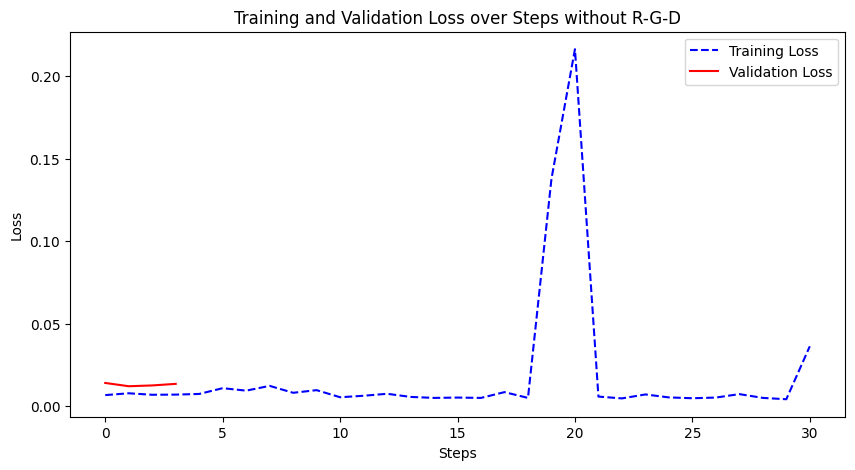

In [ ]:
#Training abd Validation loss values
train_loss_values = [log['loss'] for log in trainer.state.log_history if 'loss' in log]
eval_loss_values = [log['eval_loss'] for log in trainer.state.log_history if 'eval_loss' in log]
eval_accuracy_values = [log['eval_accuracy'] for log in trainer.state.log_history if 'eval_accuracy' in log]

plt.figure(figsize=(10, 5))
plt.plot(train_loss_values, label="Training Loss", color='blue', linestyle='--')
plt.plot(eval_loss_values, label="Validation Loss", color='red', linestyle='-')
plt.xlabel("Steps")
plt.ylabel("Loss")
plt.title("Training and Validation Loss over Steps without R-G-D")
plt.legend()
plt.show()

### Model 2 (epochs = 20, Learning Rate = 3e-5, L2 Regulzarization, Gradient Clipping = 1.0, Momentum = 0.8)

In [ ]:
from torch.optim import SGD

#base directory for saving models and logs
base_dir = "/content/drive/MyDrive/Data_Project/BLIP/experiments"  

experiment_name = f"lr{config['learning_rate']}_bs{config['batch_size']}_epochs{config['num_epochs']}"
experiment_dir = os.path.join(base_dir, experiment_name)

output_dir = os.path.join(experiment_dir, "results")
logging_dir = os.path.join(experiment_dir, "logs")
os.makedirs(output_dir, exist_ok=True)
os.makedirs(logging_dir, exist_ok=True)

# Model 2 Training Arguments Configuration
config_reg = {
    "learning_rate": 3e-4,
    "batch_size": 4,
    "num_epochs": 20,
    "eval_strategy": "steps",  
    "save_strategy": "epoch",  
    "save_total_limit": 2,  
    "logging_steps": 10,  
}

# Training arguments with regularization, gradient clipping, and momentum
training_args_with_reg = TrainingArguments(
    output_dir=output_dir,
    evaluation_strategy=config_reg["eval_strategy"],
    learning_rate=config_reg["learning_rate"],
    per_device_train_batch_size=4,
    per_device_eval_batch_size=4,
    num_train_epochs=config_reg["num_epochs"],
    save_strategy=config_reg["save_strategy"],
    save_total_limit=config_reg["save_total_limit"],
    logging_dir=logging_dir,
    logging_steps=config_reg["logging_steps"],
    load_best_model_at_end=True,
    metric_for_best_model='eval_loss',
    fp16=True,  
    weight_decay=0.01,
    max_grad_norm=1.0, 
)

def get_sgd_optimizer(model, learning_rate, momentum=0.8):
    """
    SGD optimizer with momentum
    """
    return SGD(model.parameters(), lr=learning_rate, momentum=momentum)

trainer_with_reg = Trainer(
    model=model,
    args=training_args_with_reg,
    train_dataset=train_dataset,
    eval_dataset=test_dataset,
    callbacks=[EarlyStoppingCallback(early_stopping_patience=2)],
    optimizers=(get_sgd_optimizer(model, config["learning_rate"], momentum=0.8), None)  
)

train_results_with_reg = trainer_with_reg.train()

/usr/local/lib/python3.10/dist-packages/transformers/training_args.py:1568: FutureWarning: `evaluation_strategy` is deprecated and will be removed in version 4.46 of 🤗 Transformers. Use `eval_strategy` instead
  warnings.warn(


Epoch,Training Loss,Validation Loss
1,0.006700,0.011963
2,0.004500,0.011863
3,0.003600,0.010530
4,0.004000,0.011828
5,0.005200,0.011220


There were missing keys in the checkpoint model loaded: ['text_decoder.cls.predictions.decoder.bias'].


### Training and Validation Loss

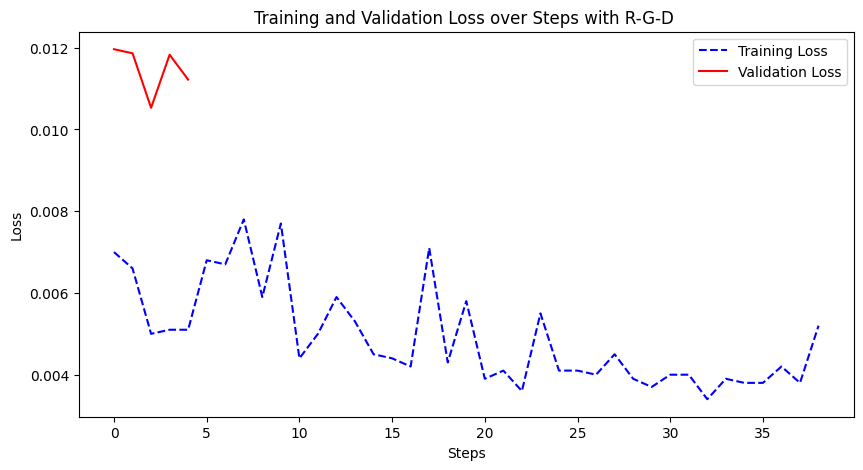

In [ ]:
train_loss_values = [log['loss'] for log in trainer_with_reg.state.log_history if 'loss' in log]
eval_loss_values = [log['eval_loss'] for log in trainer_with_reg.state.log_history if 'eval_loss' in log]
eval_accuracy_values = [log['eval_accuracy'] for log in trainer_with_reg.state.log_history if 'eval_accuracy' in log]

plt.figure(figsize=(10, 5))
plt.plot(train_loss_values, label="Training Loss", color='blue', linestyle='--')
plt.plot(eval_loss_values, label="Validation Loss", color='red', linestyle='-')
plt.xlabel("Steps")
plt.ylabel("Loss")
plt.title("Training and Validation Loss over Steps with R-G-D ")
plt.legend()
plt.show()

### Testing the Model 2 (Better) on Test Dataset

In [ ]:
import evaluate
import torch
import numpy as np
from tqdm import tqdm

bleu_metric = evaluate.load("bleu")
rouge_metric = evaluate.load("rouge")

def evaluate_model(model, processor, test_dataset):
    """
    Evaluates the model on the test dataset and calculates BLEU and ROUGE scores.
    """
    model.eval() 
    predictions = []  
    references = []  

    for example in tqdm(test_dataset):  
        try:
            image = Image.open(requests.get(example['image_path'], stream=True).raw).convert("RGB")
        except Exception as e:
            print(f"Error loading image for evaluation: {e}")
            continue

        inputs = processor(text=[example['input_text']], images=[image], return_tensors="pt", padding=True).to(model.device)
        labels = example['label']  

        outputs = model.generate(
            **inputs,
            max_new_tokens=50,  
            num_beams=5,  
            early_stopping=True  
        )

        decoded_prediction = processor.decode(outputs[0], skip_special_tokens=True)
        predictions.append(decoded_prediction)
        references.append([example['input_text']])  

    return predictions, references

def compute_metrics(predictions, references):
    """
    Computes BLEU and ROUGE scores based on the model's predictions and ground truth references..
    """
    bleu_score = bleu_metric.compute(predictions=[[pred.split()] for pred in predictions], references=references)

    rouge_score = rouge_metric.compute(predictions=predictions, references=references)

    return bleu_score, rouge_score

# Test the model
predictions, references = evaluate_model(model, processor, test_dataset)

###### 42%|████▏     | 131/309 [06:29<07:10,  2.42s/it]/usr/local/lib/python3.10/dist-packages/PIL/Image.py:3406: DecompressionBombWarning: Image size (98058240 pixels) exceeds limit of 89478485 pixels, could be decompression bomb DOS attack.
###### warnings.warn(
###### 100%|██████████| 309/309 [14:23<00:00,  2.79s/it]

### Example Outputs by Model 2

In [ ]:
for i in range(10):
    print(f"Example {i+1}:")
    print(f"Input Text: {references[i][0]}")
    print(f"Predicted Text: {predictions[i]}")
    print(f"Reference Text: {references[i]}")
    print("\n")

Example 1:
Input Text: Flowers
Predicted Text: flowers flowers flowers flowers flowers flowers flowers flowers flowers flowers flowers flowers flowers flowers flowers flowers flowers flowers flowers flowers flowers flowers flowers flowers flowers flowers flowers flowers flowers flowers flowers flowers flowers flowers flowers flowers flowers flowers flowers flowers flowers flowers flowers flowers flowers flowers flowers flowers flowers flowers flowers
Reference Text: ['Flowers']


Example 2:
Input Text: Diamond beach Iceland
Predicted Text: diamond beach iceland iceland iceland iceland iceland iceland iceland iceland iceland iceland iceland iceland iceland iceland iceland iceland iceland iceland iceland iceland iceland iceland iceland iceland iceland iceland iceland iceland iceland iceland iceland iceland iceland iceland iceland iceland iceland iceland iceland iceland iceland iceland iceland iceland iceland iceland iceland iceland iceland iceland iceland
Reference Text: ['Diamond beach 

### Test Accuracy

In [ ]:
def calculate_accuracy(predictions, references):
    """
    Calculate accuracy as the percentage of exact matches.
    """
    exact_matches = sum([1 if pred == ref[0] else 0 for pred, ref in zip(predictions, references)])
    accuracy = exact_matches / len(predictions) * 100
    return accuracy

accuracy = calculate_accuracy(predictions, references)
print(f"Test Accuracy: {accuracy:.2f}%")

Test Accuracy: 63.11%


### BLEU & ROUGE Score

In [ ]:
bleu_score, rouge_score = compute_metrics(predictions, references)
print(f"BLEU Score: {bleu_score['bleu']}")
print(f"ROUGE Scores: {rouge_score}")

BLEU Score: 0.14969786058699214
ROUGE Scores: {'rouge1': 0.48361315050496523, 'rouge2': 0.4373383371417872, 'rougeL': 0.48286131318787884, 'rougeLsum': 0.4844244669687602}


### Output - Generate Caption for a Photo

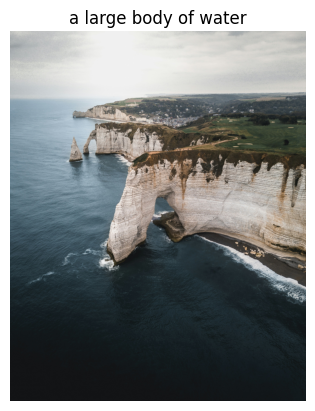

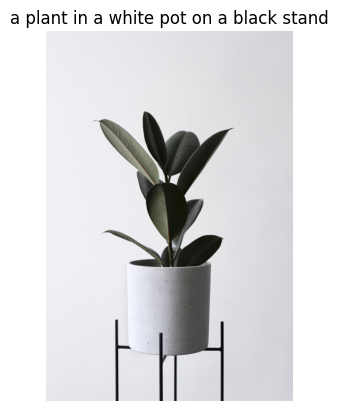

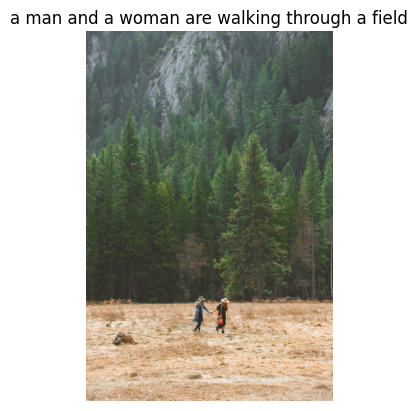

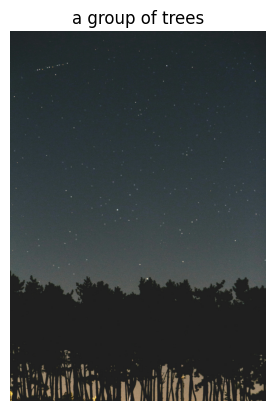

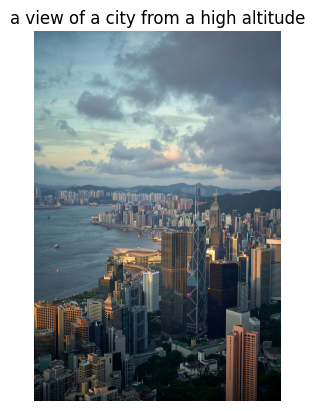

In [ ]:
import torch
from torchvision import transforms
from PIL import Image
from transformers import AutoTokenizer
import requests
import random
import matplotlib.pyplot as plt

# BLIP tokenizer
tokenizer = AutoTokenizer.from_pretrained("Salesforce/blip-image-captioning-base")

def preprocess_image(image_url, transform=None):
    """
    Load and preprocess an image from a URL.
    """
    image = Image.open(requests.get(image_url, stream=True).raw).convert("RGB")
    if transform:
        image = transform(image)  
    return image

# Transformation pipeline for the image
transform = transforms.Compose([
    transforms.Resize((224, 224)),  # Resize the image
    transforms.ToTensor(),  # Convert to tensor
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]),  # Normalize as per pre-trained model
])

# The models to be used for generating captions for images
image_encoder = CNNImageEncoder(input_channels=3, output_dim=512)
text_decoder = TransformerDecoder(vocab_size=len(tokenizer), hidden_dim=512)
blip_model = BLIPModel(image_encoder, text_decoder, hidden_dim=512)

# Randomly select 10 images from photos_df
random_rows = random.sample(range(10, len(photos_df)), 5)
selected_images = photos_df.iloc[random_rows]

# Display the images with their generated captions
for idx, row in selected_images.iterrows():
    image_url = row['photo_image_url']
    image = preprocess_image(image_url, transform)
    image_tensor = image.unsqueeze(0)  

    image_tensor = image_tensor.to(blip_model.device)  

    with torch.no_grad():
        generated_tokens = blip_model.generate(image_tensor)

    generated_caption = tokenizer.decode(generated_tokens[0], skip_special_tokens=True)

    plt.imshow(image)
    plt.axis('off')  
    plt.title(generated_caption)  
    plt.show()